In [13]:
include("src/Utils.jl")
include("src/Simulator.jl")

In [54]:
#Number of epochs to be simulated
n_epochs = 100000

#The type of Proof-of-Stake: Weighted, OppositeWeighted, GiniStabilized
proof_of_stake = Weighted

#The initial volume of stakes in the pool
initial_stake_volume = 50000.0

#The initial distribution of tokens: Uniform, Gini, Random
initial_distribution = Gini

#The number of peers (or validators) in the blockchain
n_peers = 5000

#The number of corrupted peers (or validators) in the blockchain
n_corrupted = 10

#The probability that, in case a corrupted validator is chosen, it fails to validate the blockchain
p_fail = 0.5

#Probability of a new peer to join the pool at any epoch
p_join = 0.001

#Probability of a peer to quit the pool at any epoch
p_quit = 0.001

#The amount of tokens owned by the new peer
join_amount = NewRandom

#Percentage of coins removed from the corrupted validator in case he fails to validate the block
penalty_percentage = 0.5

#Target value for GiniStabilized PoS
θ = 0.3

#Constant reward earned by the validator
reward = 50.0
;

In [55]:
parameters = Parameters(
    n_epochs,
    proof_of_stake,
    initial_stake_volume,
    initial_distribution,
    n_peers,
    n_corrupted,
    p_fail,
    p_join,
    p_quit,
    join_amount,
    penalty_percentage,
    θ,
    reward
)


Parameters(100000, Weighted, 50000.0, Gini, 5000, 10, 0.5, 0.001, 0.001, NewRandom, 0.5, 0.3, 50.0)

In [56]:
history_collection = ThreadSafeDict()

simulations = 1

starting_ginis = [0.01, 0.2, 0.4, 0.6, 0.8]

@Threads.threads for i in 1:size(starting_ginis)[1]
    stakes = generate_peers(n_peers, initial_stake_volume, Gini, starting_ginis[i]);
    
    history_collection[i] = simulate(stakes, parameters);
end

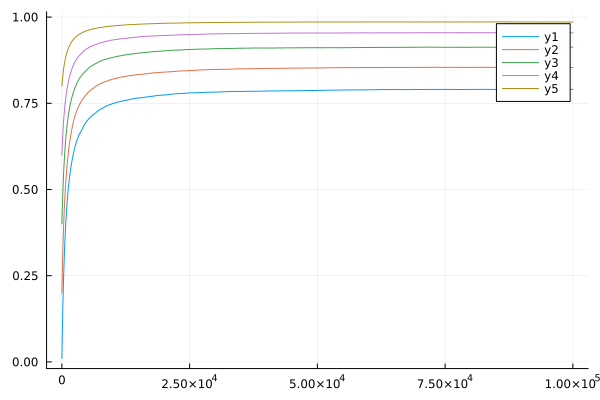

In [57]:
plot(history_collection[1])
plot!(history_collection[2])
plot!(history_collection[3])
plot!(history_collection[4])
plot!(history_collection[5])

In [58]:
using DelimitedFiles

# Export the vector to a text file
writedlm("results/e1.txt", history_collection[1][1:1000:end])
writedlm("results/e2.txt", history_collection[2][1:1000:end])
writedlm("results/e3.txt", history_collection[3][1:1000:end])
writedlm("results/e4.txt", history_collection[4][1:1000:end])
writedlm("results/e5.txt", history_collection[5][1:1000:end])